<a href="https://colab.research.google.com/github/AnatoliiBalakiriev/VEO2/blob/main/vision/getting-started/veo2_video_generation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Copyright 2025 Google LLC
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# Veo 2 Video Generation

<table align="left">
  <td style="text-align: center">
    <a href="https://colab.research.google.com/github/GoogleCloudPlatform/generative-ai/blob/main/vision/getting-started/veo2_video_generation.ipynb">
      <img src="https://cloud.google.com/ml-engine/images/colab-logo-32px.png" alt="Google Colaboratory logo"><br> Run in Colab
    </a>
  </td>
  <td style="text-align: center">
    <a href="https://console.cloud.google.com/vertex-ai/colab/import/https:%2F%2Fraw.githubusercontent.com%2FGoogleCloudPlatform%2Fgenerative-ai%2Fmain%2Fvision%2Fgetting-started%2Fveo2_video_generation.ipynb">
      <img width="32px" src="https://lh3.googleusercontent.com/JmcxdQi-qOpctIvWKgPtrzZdJJK-J3sWE1RsfjZNwshCFgE_9fULcNpuXYTilIR2hjwN" alt="Google Cloud Colab Enterprise logo"><br> Run in Colab Enterprise
    </a>
  </td>
  <td style="text-align: center">
    <a href="https://console.cloud.google.com/vertex-ai/workbench/deploy-notebook?download_url=https://raw.githubusercontent.com/GoogleCloudPlatform/generative-ai/main/vision/getting-started/veo2_video_generation.ipynb">
      <img src="https://lh3.googleusercontent.com/UiNooY4LUgW_oTvpsNhPpQzsstV5W8F7rYgxgGBD85cWJoLmrOzhVs_ksK_vgx40SHs7jCqkTkCk=e14-rj-sc0xffffff-h130-w32" alt="Vertex AI logo"><br> Open in Vertex AI Workbench
    </a>
  </td>    
  <td style="text-align: center">
    <a href="https://github.com/GoogleCloudPlatform/generative-ai/blob/main/vision/getting-started/veo2_video_generation.ipynb">
      <img src="https://cloud.google.com/ml-engine/images/github-logo-32px.png" alt="GitHub logo"><br> View on GitHub
    </a>
  </td>
</table>

<div style="clear: both;"></div>

<b>Share to:</b>

<a href="https://www.linkedin.com/sharing/share-offsite/?url=https%3A//github.com/GoogleCloudPlatform/generative-ai/blob/main/vision/getting-started/veo2_video_generation.ipynb" target="_blank">
  <img width="20px" src="https://upload.wikimedia.org/wikipedia/commons/8/81/LinkedIn_icon.svg" alt="LinkedIn logo">
</a>

<a href="https://bsky.app/intent/compose?text=https%3A//github.com/GoogleCloudPlatform/generative-ai/blob/main/vision/getting-started/veo2_video_generation.ipynb" target="_blank">
  <img width="20px" src="https://upload.wikimedia.org/wikipedia/commons/7/7a/Bluesky_Logo.svg" alt="Bluesky logo">
</a>

<a href="https://twitter.com/intent/tweet?url=https%3A//github.com/GoogleCloudPlatform/generative-ai/blob/main/vision/getting-started/veo2_video_generation.ipynb" target="_blank">
  <img width="20px" src="https://upload.wikimedia.org/wikipedia/commons/5/5a/X_icon_2.svg" alt="X logo">
</a>

<a href="https://reddit.com/submit?url=https%3A//github.com/GoogleCloudPlatform/generative-ai/blob/main/vision/getting-started/veo2_video_generation.ipynb" target="_blank">
  <img width="20px" src="https://redditinc.com/hubfs/Reddit%20Inc/Brand/Reddit_Logo.png" alt="Reddit logo">
</a>

<a href="https://www.facebook.com/sharer/sharer.php?u=https%3A//github.com/GoogleCloudPlatform/generative-ai/blob/main/vision/getting-started/veo2_video_generation.ipynb" target="_blank">
  <img width="20px" src="https://upload.wikimedia.org/wikipedia/commons/5/51/Facebook_f_logo_%282019%29.svg" alt="Facebook logo">
</a>

| | |
|-|-|
|Author(s) | [Katie Nguyen](https://github.com/katiemn) |

## Overview

### Veo 2

Veo 2 on Vertex AI brings Google's state of the art video generation capabilities to application developers. It's capable of creating videos with astonishing detail that simulate real-world physics across a wide range of visual styles.

In this tutorial, you will learn how to use the Google Gen AI SDK for Python to interact with Veo 2 and generate new videos from text prompts and input images.

## Get started

### Install Google Gen AI SDK for Python and other libraries

In [2]:
%pip install --upgrade --quiet google-genai
%pip install -q mediapy

### Authenticate your notebook environment (Colab only)

If you are running this notebook on Google Colab, run the following cell to authenticate your environment.

In [3]:
import sys

if "google.colab" in sys.modules:
    from google.colab import auth

    auth.authenticate_user()

### Import libraries

In [4]:
import time
import urllib

from PIL import Image as PIL_Image
from google import genai
from google.genai import types
import matplotlib.pyplot as plt
import mediapy as media

### Set Google Cloud project information and create client

To get started using Vertex AI, you must have an existing Google Cloud project and [enable the Vertex AI API](https://console.cloud.google.com/flows/enableapi?apiid=aiplatform.googleapis.com).

Learn more about [setting up a project and a development environment](https://cloud.google.com/vertex-ai/docs/start/cloud-environment).

In [5]:
import os

CONFIG_PROJECT_ID = "gen-lang-client-0279389978"  # @param {type: "string", placeholder: "[your-project-id]", isTemplate: true}
# Optionally, allow override from GOOGLE_CLOUD_PROJECT environment variable if it's set.
ENV_PROJECT_ID = os.environ.get("GOOGLE_CLOUD_PROJECT")

if ENV_PROJECT_ID:
    PROJECT_ID = ENV_PROJECT_ID
    print(f"Using Project ID from environment variable: {PROJECT_ID}")
else:
    PROJECT_ID = CONFIG_PROJECT_ID
    print(f"Using Project ID from Colab form/config: {PROJECT_ID}")

# Final sanity check to prevent using "None" or an empty string
if not PROJECT_ID or PROJECT_ID.lower() == "none" or PROJECT_ID.strip() == "":
    raise ValueError(
        f"Project ID is invalid ('{PROJECT_ID}'). "
        "Please ensure the Colab form has your correct project ID, or that "
        "the GOOGLE_CLOUD_PROJECT environment variable is set correctly if you intend to use it."
    )

LOCATION = os.environ.get("GOOGLE_CLOUD_REGION", "us-central1")
print(f"Using Location: {LOCATION}")

client = genai.Client(vertexai=True, project=PROJECT_ID, location=LOCATION)

Using Project ID from Colab form/config: gen-lang-client-0279389978
Using Location: us-central1


### Define helper functions to display media

In [6]:
def show_video(gcs_uri):
    file_name = gcs_uri.split("/")[-1]
    # Ensure gsutil is available and user is authenticated for it in Colab
    get_ipython().system(f"gsutil cp {gcs_uri} {file_name}")
    media.show_video(media.read_video(file_name), height=500)


def display_images(image) -> None:
    fig, axis = plt.subplots(1, 1, figsize=(12, 6))
    axis.imshow(image)
    axis.set_title("Starting Image")
    axis.axis("off")
    plt.show()

### Load the video generation model

In [7]:
video_model = "veo-2.0-generate-001"

### Generate videos from a text prompt

With Veo 2, you have the option to generate 8 second videos from a text prompt. In order to generate a video in the following sample, specify the following info:
- **Prompt:** A detailed description of the video you would like to see.
- **Aspect ratio:** Select either 16:9 or 9:16.
- **File location:** The generated video will be shown below with support from a previously defined helper function. The video will also be stored in Cloud Storage once video generation is complete. Specify the file path where you would like this video to be stored in the output_gcs field.
- **Number of videos:** Set this value to 1 or 2.
- **Video duration:** Can 5, 6, 7, or 8 seconds.
- **Prompt enhancement:** The `veo-2.0-generate-001` model offers the option to enhance your provided prompt. To utilize this feature, set `enhance_prompt` to True. A new, detailed prompt will be created from your original one to help generate higher quality videos that better adhere to your prompt's intent.

In [8]:
prompt = "A heartwarming birthday scene in a cozy vintage-style apartment. A woman with long dark hair, wearing a bright red dress, stands smiling with joy, holding a large vibrant bouquet of orange and yellow roses wrapped in green paper with a yellow ribbon. She gently adjusts the bouquet and looks around happily. The room is decorated with classic golden-patterned wallpaper and colorful paintings on the walls. Add subtle birthday decorations: balloons in warm tones, softly floating confetti, and glowing fairy lights in the background. The camera slowly zooms in as soft sunlight shines through a window, casting a golden glow on her face and flowers. Add a glowing birthday message in Ukrainian: “Щасливого Дня Народження!” appearing briefly on screen. The atmosphere is filled with warmth, joy, and celebration. Style: Realistic with cinematic lighting, 4K detail, soft depth of field. Gently moving elements: hair, flowers, confetti. Emotion: tender, festive, sincere."  # @param {type: 'string'}
aspect_ratio = "16:9"  # @param ["16:9", "9:16"]
output_gcs = "gs://dream-videos-bucket"  # @param {type: 'string'}
print(f"Attempting video generation with model: {video_model} in project: {PROJECT_ID}")

Attempting video generation with model: veo-2.0-generate-001 in project: gen-lang-client-0279389978


In [9]:
operation = client.models.generate_videos(
    model=video_model,
    prompt=prompt,
    config=types.GenerateVideosConfig(
        aspect_ratio=aspect_ratio,
        output_gcs_uri=output_gcs,
        number_of_videos=1,
        duration_seconds=8,
        person_generation="allow_adult",
        enhance_prompt=True,
    ),
)

In [10]:
# while not operation.done:
#     time.sleep(15)
#     operation = client.operations.get(operation)
#     print(operation)

# if operation.response:
#     show_video(operation.result.generated_videos[0].video.uri)

In [11]:
!gsutil iam ch user:cloud-lvm-video-server@prod.google.com:objectCreator gs://dream-videos-bucket

No changes made to gs://dream-videos-bucket/


In [12]:
print("Video generation operation started...")
while not operation.done: # operation.done might be a property or a method operation.done()
    print("Waiting for operation to complete...")
    time.sleep(15)
    # The way to refresh/get operation status might differ.
    # If 'operation' is a google.api_core.operation.Operation, then .done is a property.
    # The original code client.operations.get(operation) implies 'operation' itself is not the LRO object
    # but perhaps a reference or name. This depends heavily on what client.models.generate_videos returns.
    # Let's assume the initial 'operation' object has a 'name' or similar attribute for polling.
    # And that client.operations.get() is the correct way to poll.
    # If 'operation' is already the LRO object, you might just check 'operation.done'.
    # The original code was: operation = client.operations.get(operation)
    # This suggests 'operation' might need to be an operation name.
    # If client.models.generate_videos returns an LRO object directly:
    # if hasattr(operation, 'operation') and hasattr(operation.operation, 'name'):
    #     operation_name = operation.operation.name
    # else if hasattr(operation, 'name'):
    #     operation_name = operation.name
    # else:
    #     print("Cannot determine operation name for polling. Assuming 'operation' object updates itself.")
    #     # If 'operation' updates itself, the loop is fine. Otherwise, polling needs an ID.
    #     # For now, sticking to your original polling logic, assuming 'operation' can be passed to get()

    # The error indicates the initial call fails, so polling logic is secondary for now.
    # However, if client.models.generate_videos returns an object that has a 'name' attribute for the LRO:
    try:
        operation_name = operation.name # Common for LROs from google-cloud libraries
                                        # Or operation.operation.name if it's nested
        operation = client.operations.get(operation) # Pass as named argument 'name'
    except AttributeError:
        print("Warning: Could not get operation name for polling. The 'operation' object might update in place or polling might fail.")
        # If the operation object updates itself, this is fine.
        # If client.operations.get() expects the raw operation object itself, your original code was fine for that part.

    print(f"Operation status: {operation.metadata if hasattr(operation, 'metadata') else 'N/A'}")


if operation.response:
    print("Operation successful!")
    # Accessing result might be operation.result() if it's a future-like object
    video_uri = operation.result().generated_videos[0].video.uri if callable(operation.result) else operation.response.generated_videos[0].video.uri
    show_video(video_uri)
else:
    print("Operation may have failed or did not produce a response in the expected way.")
    if operation.error:
        print(f"Error: {operation.error}")

Video generation operation started...
Waiting for operation to complete...
Operation status: None
Waiting for operation to complete...
Operation status: None
Waiting for operation to complete...
Operation status: None
Operation successful!
Copying gs://dream-videos-bucket/10992320014091593795/sample_0.mp4...
- [1 files][  3.5 MiB/  3.5 MiB]                                                
Operation completed over 1 objects/3.5 MiB.                                      


When generating videos of people you can also set the `person_generation` parameter accordingly:
* `person_generation`: allow_adult, dont_allow

In [14]:
# prompt = "sculpting a bowl on a pottery wheel"  # @param {type: 'string'}
# aspect_ratio = "9:16"  # @param ["16:9", "9:16"]
# output_gcs = "gs://dream-videos-bucket"  # @param {type: 'string'}

# operation = client.models.generate_videos(
#     model=video_model,
#     prompt=prompt,
#     config=types.GenerateVideosConfig(
#         aspect_ratio=aspect_ratio,
#         output_gcs_uri=output_gcs,
#         number_of_videos=1,
#         duration_seconds=8,
#         person_generation="allow_adult",
#         enhance_prompt=True,
#     ),
# )

# while not operation.done:
#     time.sleep(15)
#     operation = client.operations.get(operation)
#     print(operation)

# if operation.response:
#     show_video(operation.result.generated_videos[0].video.uri)

name='projects/gen-lang-client-0279389978/locations/us-central1/publishers/google/models/veo-2.0-generate-001/operations/f6edfb66-8892-4cef-871c-5fd7b04308e4' metadata=None done=None error=None response=None result=None


KeyboardInterrupt: 

### Generate videos from an image


#### Load the starting image

You can also generate a video by starting with an input image. Add the Cloud Storage file location of the image you'd like to use to display it below.

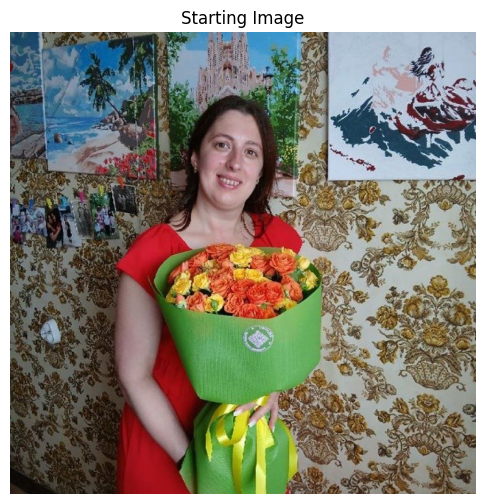

In [23]:
image_show = PIL_Image.open(
    urllib.request.urlopen(
        "https://storage.googleapis.com/images_for_veo/test.png"
    )
)
display_images(image_show)

#### Send the video request

If you're generating a video from an image you don't need to provide a prompt. The model will simply add motion to your image.


In [24]:
image_gcs = (
    "gs://images_for_veo/test.png"  # @param {type: 'string'}
)
aspect_ratio = "9:16"  # @param ["16:9", "9:16"]
output_gcs = "gs://dream-videos-bucket"  # @param {type: 'string'}

operation = client.models.generate_videos(
    model=video_model,
    image=types.Image(
        gcs_uri=image_gcs,
        mime_type="image/png",
    ),
    config=types.GenerateVideosConfig(
        aspect_ratio=aspect_ratio,
        output_gcs_uri=output_gcs,
        number_of_videos=1,
        duration_seconds=8,
        person_generation="allow_adult",
    ),
)

while not operation.done:
    time.sleep(15)
    operation = client.operations.get(operation)
    print(operation)

if operation.response:
    show_video(operation.result.generated_videos[0].video.uri)

name='projects/gen-lang-client-0279389978/locations/us-central1/publishers/google/models/veo-2.0-generate-001/operations/7e0146e6-34f5-43bc-8044-33af8c19ba85' metadata=None done=None error=None response=None result=None
name='projects/gen-lang-client-0279389978/locations/us-central1/publishers/google/models/veo-2.0-generate-001/operations/7e0146e6-34f5-43bc-8044-33af8c19ba85' metadata=None done=None error=None response=None result=None
name='projects/gen-lang-client-0279389978/locations/us-central1/publishers/google/models/veo-2.0-generate-001/operations/7e0146e6-34f5-43bc-8044-33af8c19ba85' metadata=None done=True error=None response=GenerateVideosResponse(generated_videos=[GeneratedVideo(video=Video(uri=gs://dream-videos-bucket/7862431687373465623/sample_0.mp4, video_bytes=None, mime_type=video/mp4))], rai_media_filtered_count=0, rai_media_filtered_reasons=None) result=GenerateVideosResponse(generated_videos=[GeneratedVideo(video=Video(uri=gs://dream-videos-bucket/7862431687373465623